In [1]:
import cv2
import os
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.autograd as autograd
from torch.utils.data import DataLoader,Dataset
from torch.autograd import Variable
import torchvision

In [2]:
def read_imgs(dir):
    ret = []
    names = os.listdir(dir)
    for name in names:
        if not name.endswith('jpg') :
            continue
        path = os.path.join(dir,name)
        img = cv2.cv2.imread(path)
        img = cv2.cv2.cvtColor(img,cv2.cv2.COLOR_BGR2RGB)
        ret.append(img)
    return ret
        

In [3]:
import numpy as np
# all_imgs = read_imgs('./faces/')
# np.save('./all_imgs.npy',imgs)
all_imgs = np.load('./all_imgs.npy')

In [4]:
transform = transforms.Compose([transforms.ToPILImage(),
                                transforms.Resize((64,64)),
                               transforms.ToTensor()])
class ImgDataSet(Dataset):
    def __init__(self,x,transform = transform):
        self.x = x
        self.transform = transform
        self.len = len(x)
        
    def __len__(self):
        return self.len
    
    def __getitem__(self,index):
        return transform(self.x[index])

In [5]:
class Generate(nn.Module):
    def make_layer(self,in_dim,out_dim):
        layer = nn.Sequential(
            nn.ConvTranspose2d(in_dim,out_dim,3,2,1,1),
            nn.BatchNorm2d(out_dim),
            nn.LeakyReLU()
            )
        return layer
    def __init__(self,z_dim):
        super(Generate,self).__init__()
        self.z_dim = z_dim
        self.dim = 64
        self.fc = nn.Linear(self.z_dim,self.dim*8*4*4)
        self.convTrans = nn.Sequential(
                self.make_layer(self.dim*8,self.dim*4),   
                self.make_layer(self.dim*4,self.dim*2),
                self.make_layer(self.dim*2,self.dim),
                nn.ConvTranspose2d(self.dim,3,3,2,1,1),
                nn.Sigmoid()
            )
    def forward(self,x):
        x = self.fc(x)
        x = x.view(x.size(0),-1,4,4)
        x = self.convTrans(x)
        return x
        

In [6]:
class Discriminate(nn.Module):
    def make_layer(self,in_dim,out_dim):
        layer = nn.Sequential(
            nn.Conv2d(in_dim,out_dim,3,1,1),
#             nn.BatchNorm2d(out_dim),
            nn.InstanceNorm2d(out_dim),
            nn.LeakyReLU(),
            nn.MaxPool2d(2,2)
            )
        return layer
    def __init__(self):
        super(Discriminate,self).__init__()
        dim = 64
        self.conv = nn.Sequential(
                self.make_layer(3,dim),
                self.make_layer(dim,dim*2),
                self.make_layer(dim*2,dim*4),
                self.make_layer(dim*4,dim*8),
                nn.Conv2d(dim * 8, 1, 4),
                nn.LeakyReLU(0.2)
            )
    def forward(self,x):
        x = self.conv(x)
        x = x.view(-1)
        return x

In [7]:
a = torch.ones(300,4,5,3,requires_grad=True)
b = a*3
grad= autograd.grad(b,a,torch.ones_like(a))
print(grad[0].shape)
print(grad)

torch.Size([300, 4, 5, 3])
(tensor([[[[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]]],


        [[[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.]],

         [[3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3.],
          [3., 3., 3

In [8]:
def gradient_penalty( D,real_data, generated_data):
    batch_size = real_data.size()[0]
    # Calculate interpolation
    alpha = torch.rand(batch_size, 1, 1, 1)
    alpha = alpha.expand_as(real_data).cuda()
    interpolated = alpha * real_data.data + (1 - alpha) * generated_data.data
    interpolated = Variable(interpolated, requires_grad=True).cuda()
    
     # Calculate probability of interpolated examples
    prob_interpolated = D(interpolated)
    
    # Calculate gradients of probabilities with respect to examples
    gradients = autograd.grad(outputs=prob_interpolated,inputs=interpolated,
                              grad_outputs=torch.ones_like(prob_interpolated),
                              create_graph=True, retain_graph=True)[0]
    # Gradients have shape (batch_size, num_channels, img_width, img_height),
    # so flatten to easily take norm per example in batch
    gradients = gradients.view(batch_size, -1)
    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)
    return  (10*(gradients_norm - 1) ** 2).mean(0)

In [9]:
batch_size = 128
dataset = ImgDataSet(all_imgs)
loader = DataLoader(dataset,batch_size,shuffle=True)

In [10]:
G = Generate(100).cuda()
D = Discriminate().cuda()

In [11]:
n_epoch = 100
lr = 1e-4
optimG = torch.optim.RMSprop(G.parameters(),lr)
optimD = torch.optim.RMSprop(D.parameters(),lr)

epoch[0/10 557/557 d_l =-0.03103 g_l=-0.65136,gp_l=0.86681]]

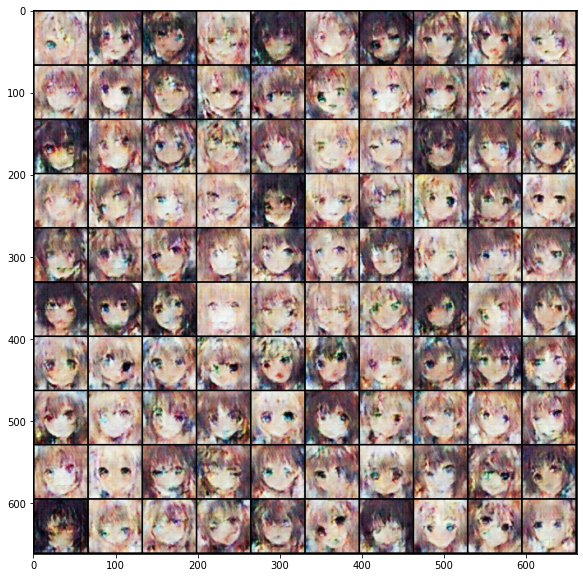

epoch[1/10 557/557 d_l =-1.84104 g_l=-1.19196,gp_l=0.17151]

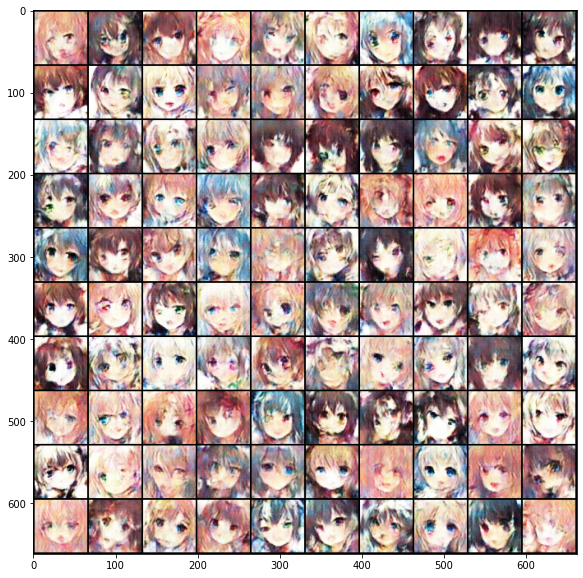

epoch[2/10 557/557 d_l =-2.01216 g_l=-1.47350,gp_l=0.22463]

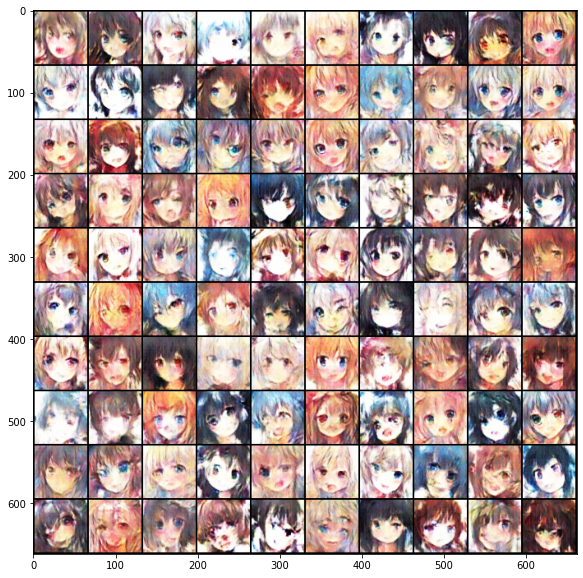

epoch[3/10 557/557 d_l =-1.88733 g_l=-1.59144,gp_l=0.22238]

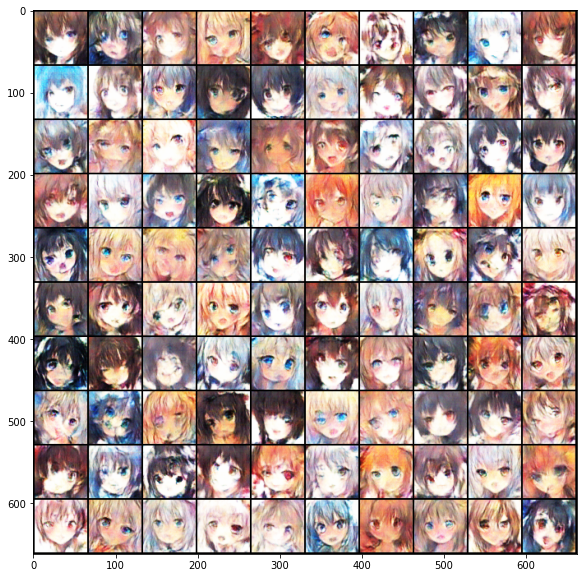

epoch[4/10 557/557 d_l =-1.77765 g_l=-1.61701,gp_l=0.21120]

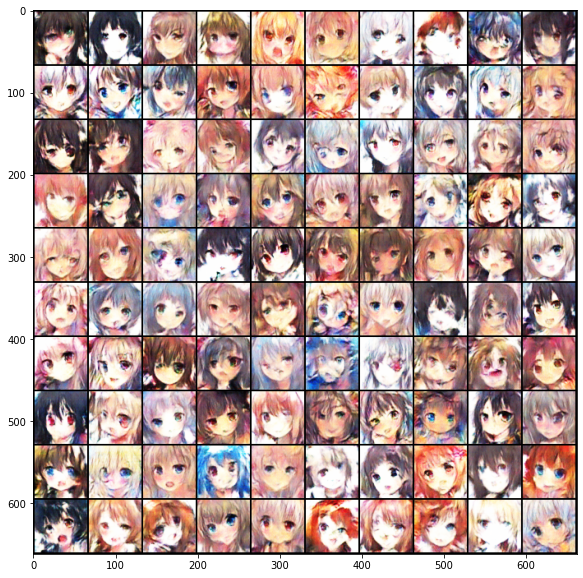

epoch[5/10 557/557 d_l =-1.71225 g_l=-1.63297,gp_l=0.20391]

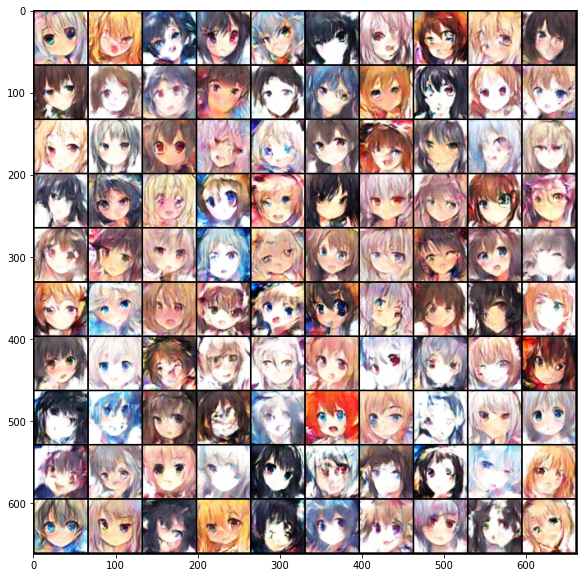

epoch[6/10 557/557 d_l =-1.64953 g_l=-1.72748,gp_l=0.19621]

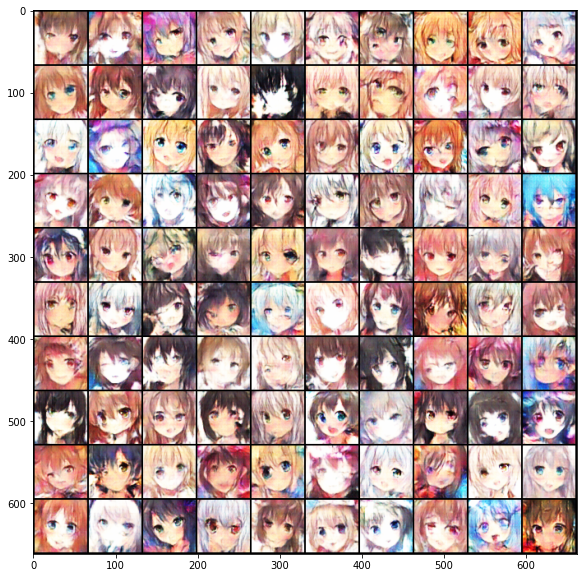

epoch[7/10 557/557 d_l =-1.60140 g_l=-1.75448,gp_l=0.18777]

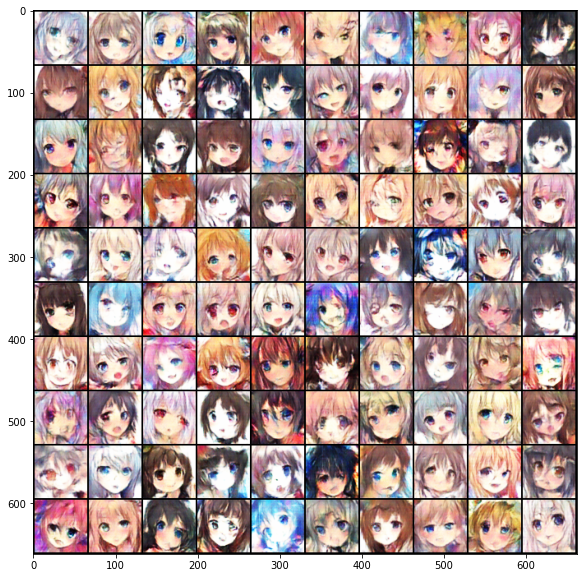

epoch[8/10 557/557 d_l =-1.55186 g_l=-1.71629,gp_l=0.18490]

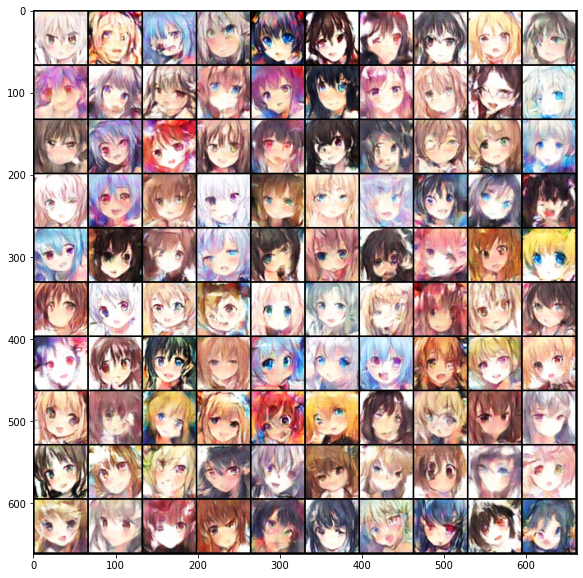

epoch[9/10 557/557 d_l =-1.51195 g_l=-1.67229,gp_l=0.17998]

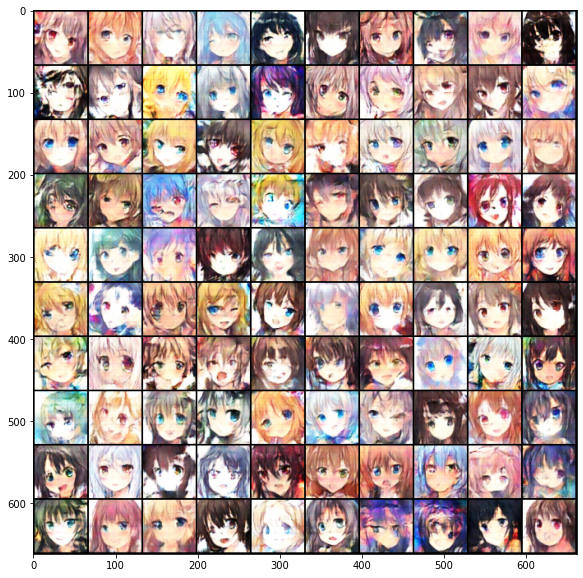

epoch[10/10 557/557 d_l =-1.48328 g_l=-1.61829,gp_l=0.17772]

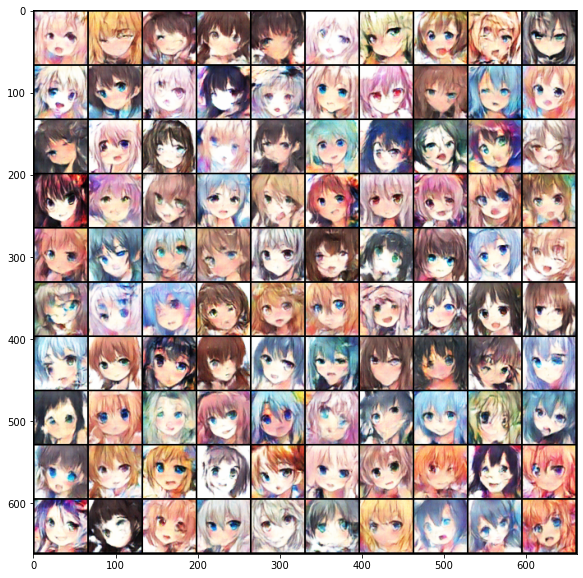

epoch[11/10 557/557 d_l =-1.45837 g_l=-1.70153,gp_l=0.17079]

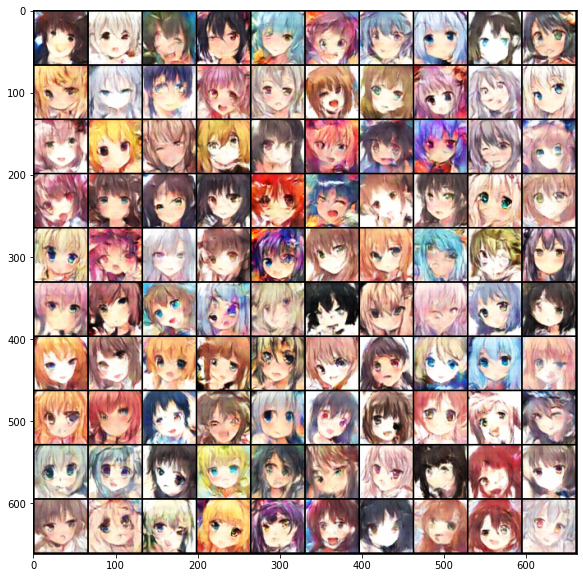

epoch[12/10 557/557 d_l =-1.43913 g_l=-1.66046,gp_l=0.16964]

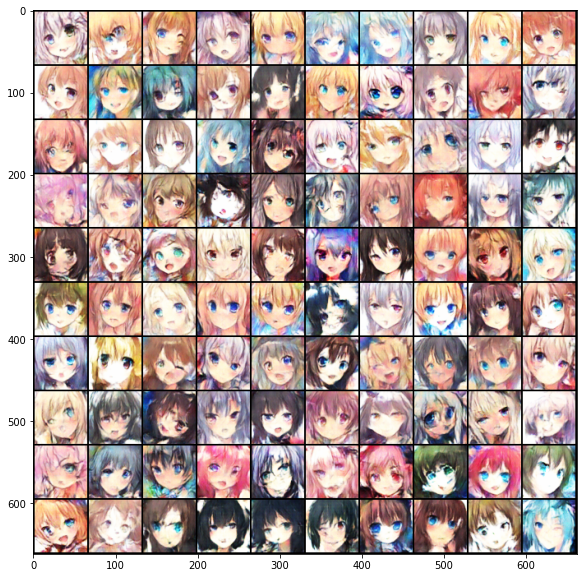

epoch[13/10 557/557 d_l =-1.41217 g_l=-1.57779,gp_l=0.16446]

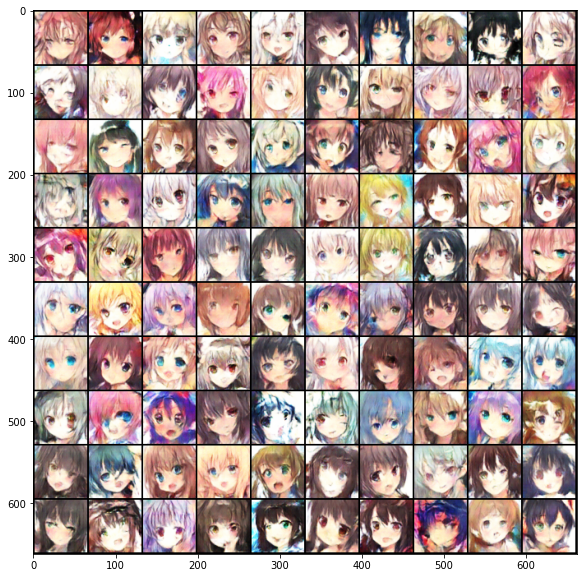

epoch[14/10 557/557 d_l =-1.40166 g_l=-1.68924,gp_l=0.16393]

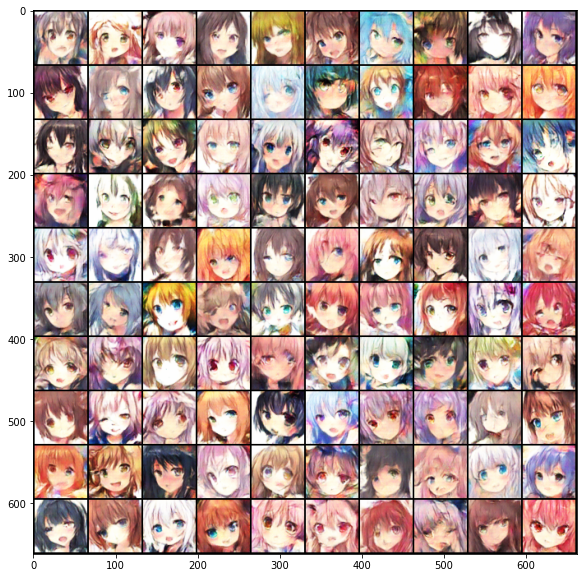

epoch[15/10 557/557 d_l =-1.38693 g_l=-1.64547,gp_l=0.16216]

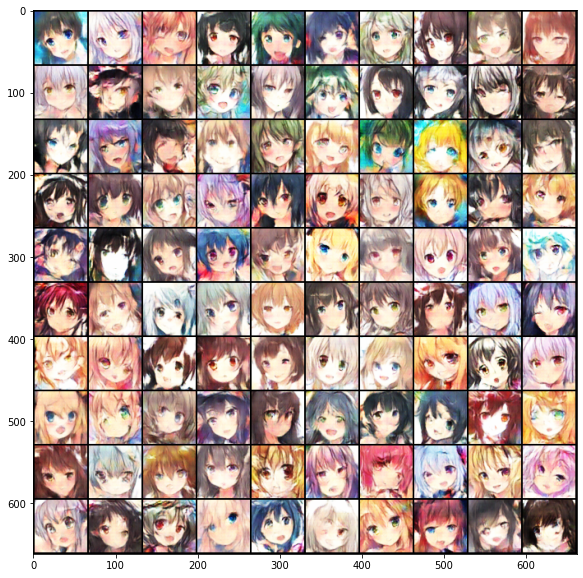

epoch[16/10 123/557 d_l =-1.38551 g_l=-1.66196,gp_l=0.16511]

In [ ]:

for epoch in range(n_epoch):
    D_loss = []
    G_loss = []
    GP_loss = []
    batch_len = int(len(dataset)//batch_size)
    G.train()
    D.train()
    for i,data in enumerate(loader):
     
#         for p in D.parameters():
#             p.data.clamp_(-0.01, 0.01)

        r_img = data.cuda()
        z = torch.randn((r_img.size(0),100)).cuda()
        f_img = G(z)
        l_r = D(r_img)
        l_f = D(f_img)
        gp = gradient_penalty(D,r_img,f_img)
        d_loss = l_f.mean(0) - l_r.mean(0) + gp
        D_loss.append(d_loss.item())
        GP_loss.append(gp.item())
        D.zero_grad()
        d_loss.backward()
        optimD.step()
        

        if (i+1) %1 ==0:
            z = torch.randn((r_img.size(0),100)).cuda()
            f_img = G(z)
            g_l = -D(f_img)
            g_l = g_l.mean(0)
            G_loss.append(g_l.item())
            G.zero_grad()
            g_l.backward()
            optimG.step()
            print(f"\repoch[%d/%d %d/%d d_l =%0.5f g_l=%0.5f,gp_l=%.5f]"
                  %(epoch,n_epoch,i,batch_len,np.mean(D_loss),np.mean(G_loss),np.mean(GP_loss)), end='')
        else:
            print(f"\repoch[%d/%d %d/%d d_l =%0.5f g_l=%0.5f,gp_l=%.5f]"
                  %(epoch,n_epoch,i,batch_len,np.mean(D_loss),np.mean(G_loss),np.mean(GP_loss)), end='')
    G.eval()
    with torch.no_grad():
        z = torch.randn((100,100)).cuda()
        g_img = G(z)
        grid_img = torchvision.utils.make_grid(g_img.cpu(), nrow=10)
        plt.figure(figsize=(10,10))
        plt.imshow(grid_img.permute(1, 2, 0))
        plt.show()
    
    
        